## About The Data: _Grandview SmartOrchard Project_
This data comes courtesy of my current company: innov8.ag, which is an agricultural technology company based in Washington state. This data is from the Washington Fruit Grandview Ranch and focuses on Honeycrisp apples, a high value and water sensitive variety. 
The overarching goal of the 2021 Smart Orchards Project is to enable grower decisioning by tying disparate data sources from various IoT agtech sensors to precisely allocate and manage a growers resources like irrigation, soil, chemicals, labor, and weather while increasing yields and quality to save money.

In [30]:
import pandas as pd
import matplotlib.pyplot as plt
import geopandas
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import contextily as cx
import os 

### _Obtaining the data:_
#### 1. "wafruit_smartorchard_nutrienttexture_05062021.csv" = soil property nutrients mapped as a series of points 
#### 2. "wafruit_grandview_smartorchard_heatmap_08162021.csv" = apple variables mapped as a series of points from the same year

In [2]:
soil_points = pd.read_csv("wafruit_smartorchard_nutrienttexture_05062021.csv")
soil_points_gpd = geopandas.GeoDataFrame(soil_points, geometry=geopandas.points_from_xy(soil_points.Longitude, soil_points.Latitude))

ga_points = pd.read_csv("wafruit_grandview_smartorchard_heatmap_08162021.csv")
ga_points_gpd = geopandas.GeoDataFrame(ga_points, geometry=geopandas.points_from_xy(ga_points.longitude, ga_points.latitude))

### _Exploring the data:_

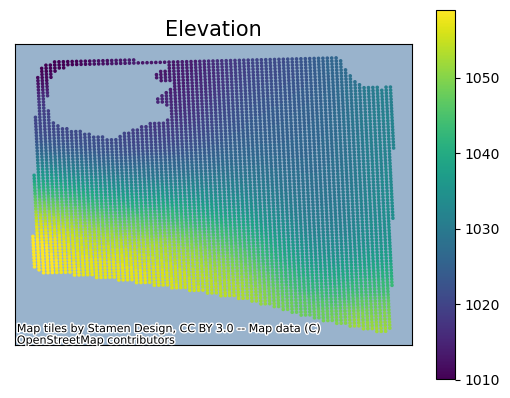

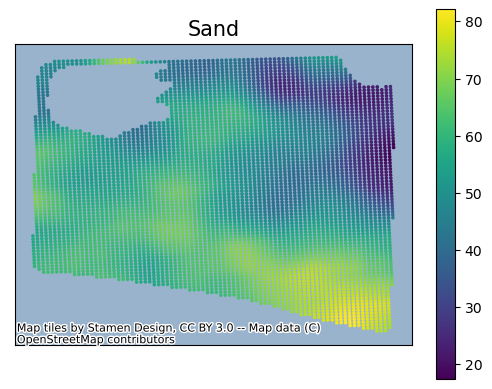

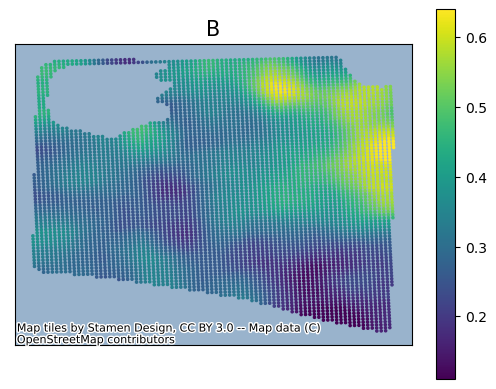

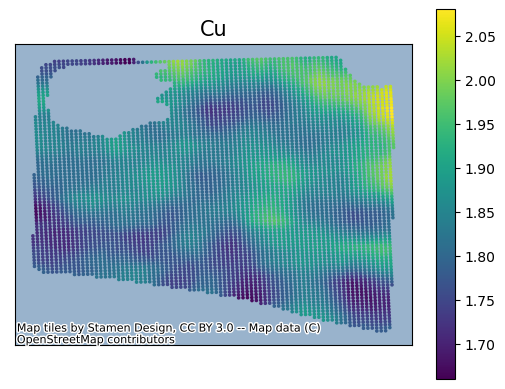

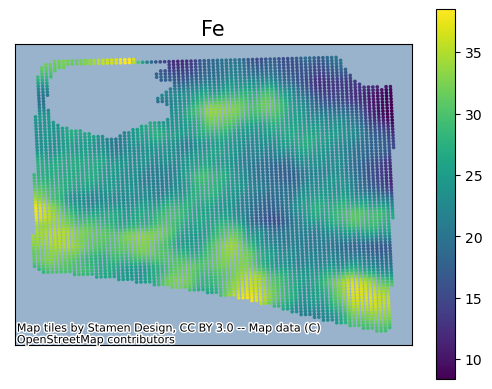

...

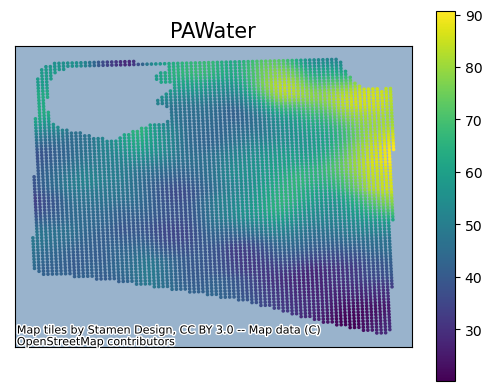

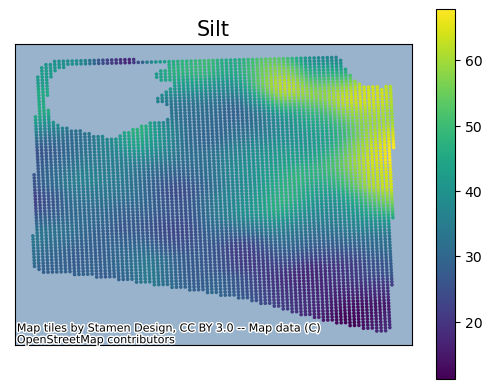

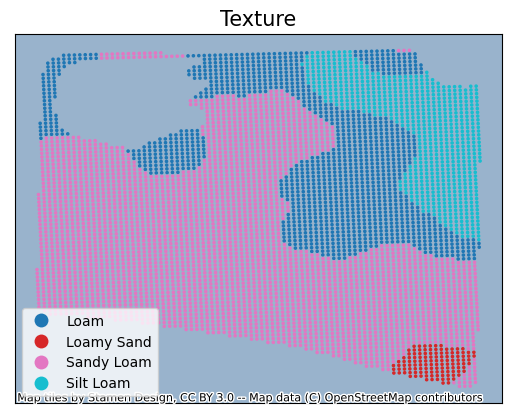

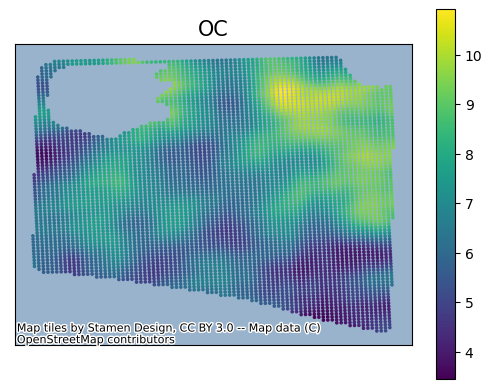

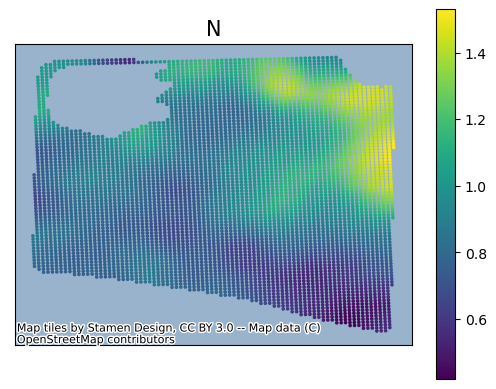

In [3]:
nutrients = ['Elevation', 'Sand', 'B', 'Cu', 'Fe','Mn', 'NH4N', 'NO3N', 'Na', 'OM', 'P', 'Salt', 'pH', 'S', 'Zn', 'Clay','CEC', 'Ca', 'Mg', 'K', 'Ca_bse', 'Ca_Mg', 'K_bse', 'K_Mg', 'Leak','Loam', 'Mg_bse', 'PAWater', 'Silt', 'Texture', 'OC', 'N']

for nutrient in nutrients:
    plot= soil_points_gpd.plot(column= nutrient, legend=True, marker=".", markersize=10)
    plt.title(nutrient, fontsize=15)
    plot.axes.get_xaxis().set_visible(False)
    plot.axes.get_yaxis().set_visible(False)
    cx.add_basemap(plot, zoom=5, crs=soil_points_gpd.crs)
    os.makedirs('figures', exist_ok=True)  
    plt.savefig('figures/'+ nutrient, bbox_inches='tight')
    plt.show()

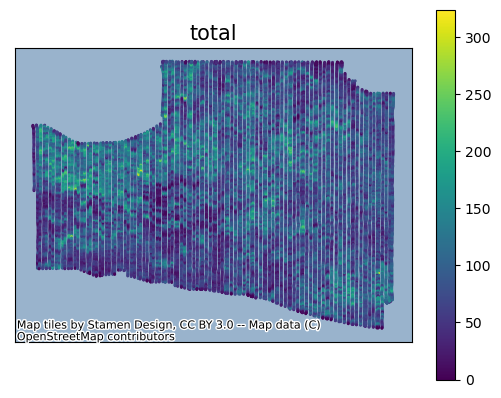

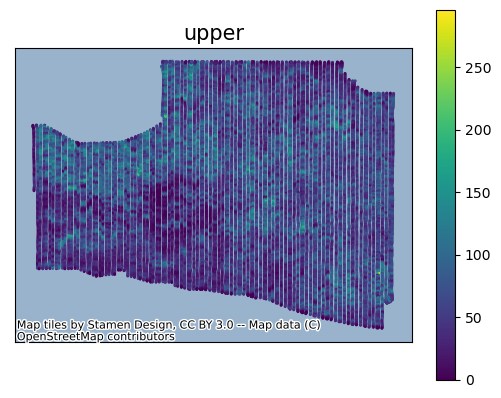

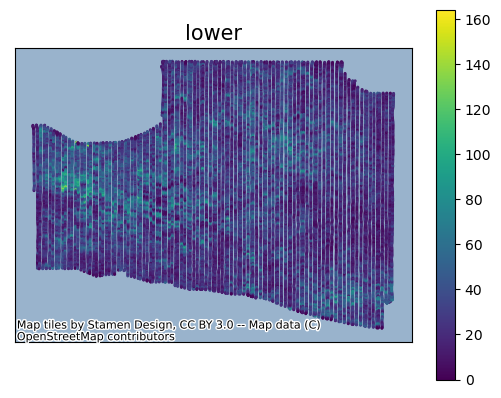

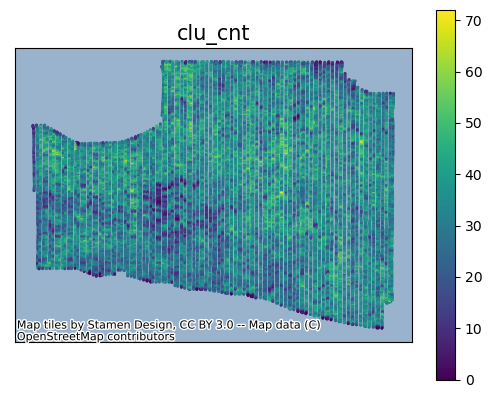

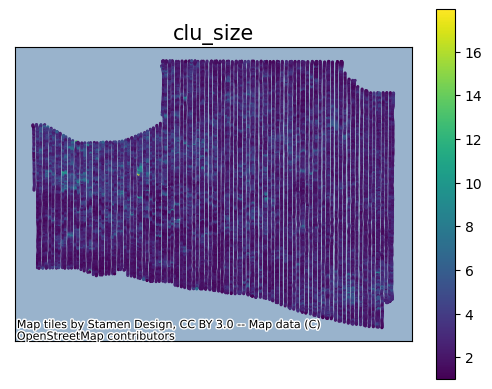

...

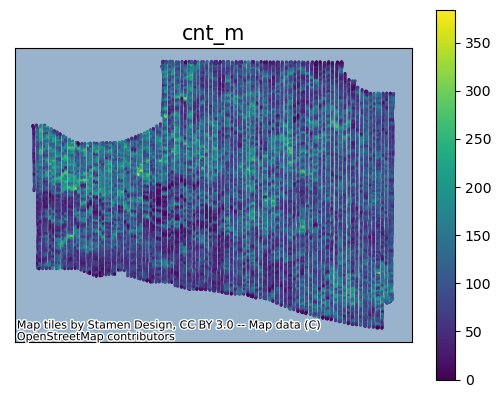

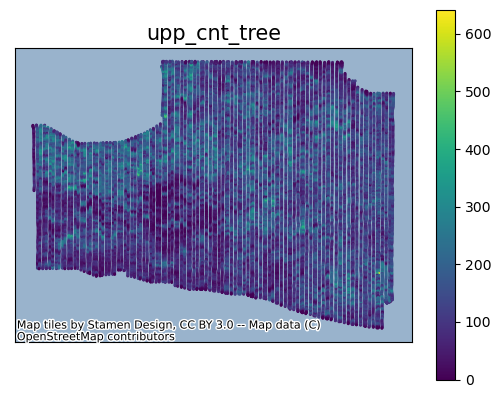

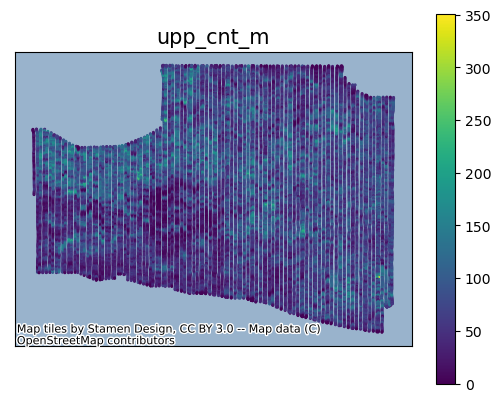

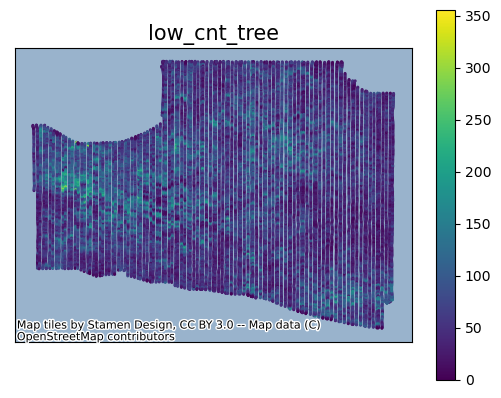

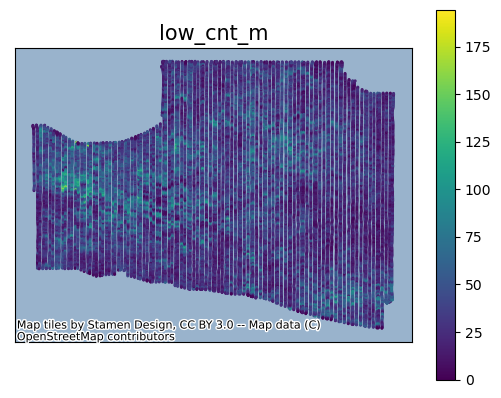

In [4]:
apple_variables = ['total', 'upper', 'lower', 'clu_cnt', 'clu_size', 'colour', 'colour_red', 'colour_green', 'colour_blue', 'hue', 'size','cnt_tree', 'cnt_m', 'upp_cnt_tree', 'upp_cnt_m', 'low_cnt_tree', 'low_cnt_m']

for variable in apple_variables:
    plot= ga_points_gpd.plot(column= variable, legend=True, marker=".", markersize=5)
    plt.title(variable, fontsize=15)
    plot.axes.get_xaxis().set_visible(False)
    plot.axes.get_yaxis().set_visible(False)
    cx.add_basemap(plot, zoom=5, crs=ga_points_gpd.crs)
    os.makedirs('figures', exist_ok=True)  
    plt.savefig('figures/'+ variable, bbox_inches='tight')
    plt.show()

## Research Question: 
This work addresses the hypothesis that there are certain soil variables which bear a significant correlation to fruit count in this agricultural field data in Grandview, Washington. 

## Data Preparation
- Since the two datasets are of drastically different sizes **(5757 rows versus 21598 rows)**, I cannot jump right into anaylsis. In order to compare the two different size data sets with different geographic information, I need to join the data to a singular layer to create a baseline for comparison. Therefore, I combined the ga and soil data into aggregated sections for the purposes of analysis and then reobtained the data in form of a shapefile.
- Additionally, I spatially joined data from the innov8.ag database from 2022 to run the Random Forest model with as well, to get a comparison between the 2021 results and the 2022 results. 

In [5]:
#data aggregated to sections 
soil_ga_gpd = geopandas.read_file("grandview_sections2.shp")
soil_ga_gpd.crs

<Derived Projected CRS: EPSG:26910>
Name: NAD83 / UTM zone 10N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: North America - between 126°W and 120°W - onshore and offshore. Canada - British Columbia; Northwest Territories; Yukon. United States (USA) - California; Oregon; Washington.
- bounds: (-126.0, 30.54, -119.99, 81.8)
Coordinate Operation:
- name: UTM zone 10N
- method: Transverse Mercator
Datum: North American Datum 1983
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

### _Exploring the spatially joined data:_

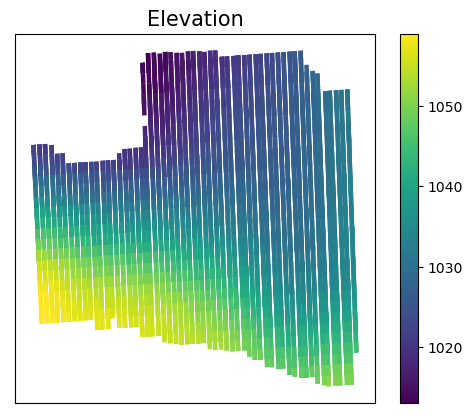

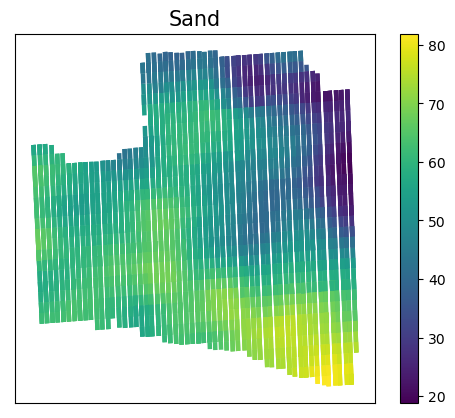

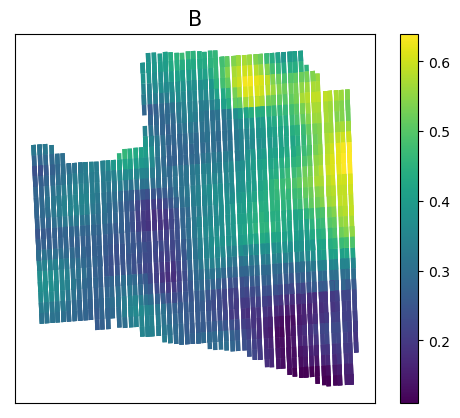

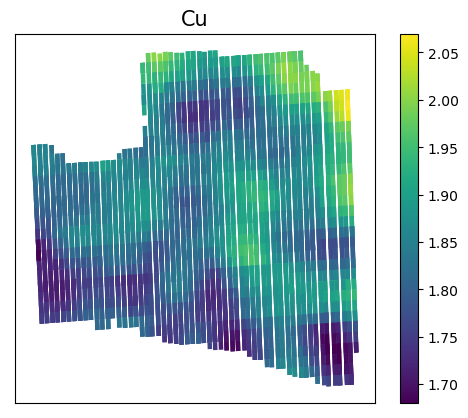

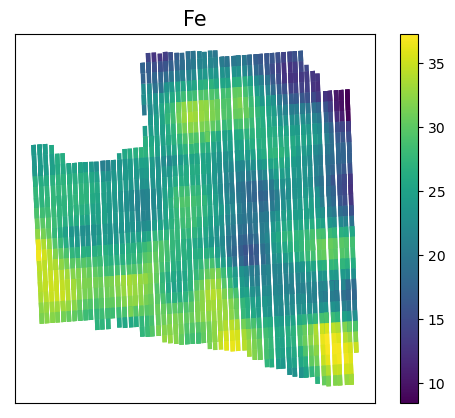

...

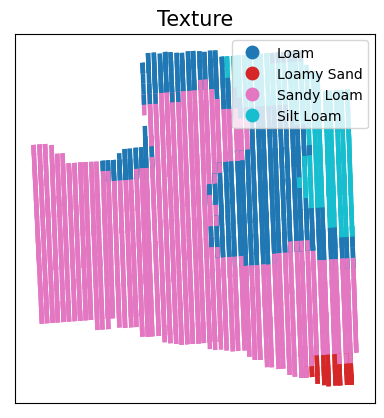

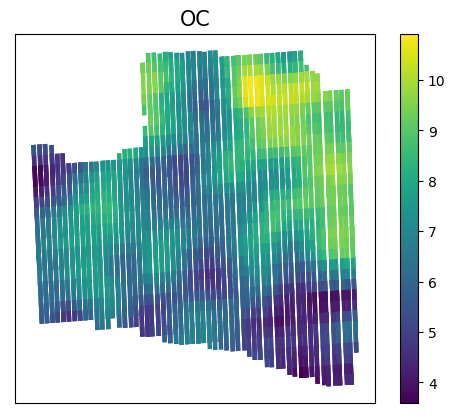

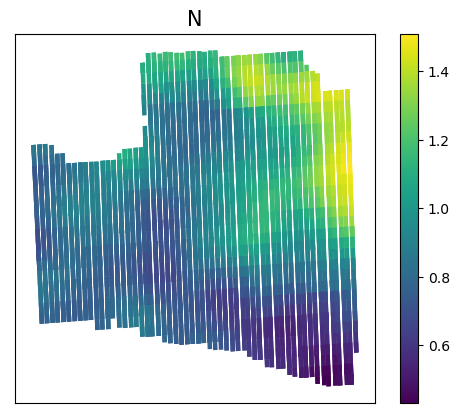

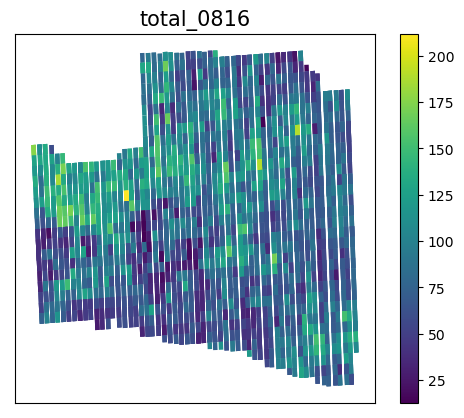

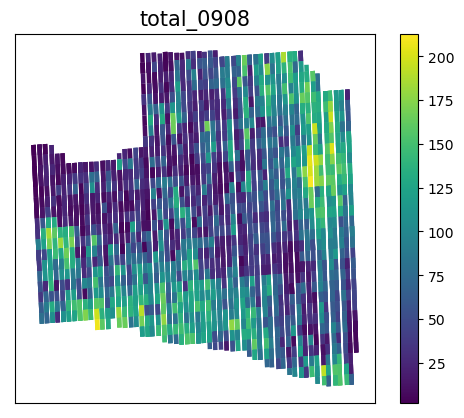

In [6]:
soil_nutrients_apple_variables = ['Elevation', 'Sand', 'B', 'Cu', 'Fe','Mn', 'NH4N', 'NO3N', 'Na', 'OM', 'P', 'Salt', 'pH', 'S', 'Zn', 'Clay','CEC', 'Ca', 'Mg', 'K', 'Ca_bse', 'Ca_Mg', 'K_bse', 'K_Mg', 'Leak','Loam', 'Mg_bse', 'PAWater', 'Silt', 'Texture', 'OC', 'N', 'total_0816', 'total_0908']

for variable in soil_nutrients_apple_variables:
    plot= soil_ga_gpd.plot(column= variable, legend=True)
    plt.title(variable, fontsize=15)
    plot.axes.get_xaxis().set_visible(False)
    plot.axes.get_yaxis().set_visible(False)
    plt.show()

In [7]:
soil_ga_df = pd.DataFrame(soil_ga_gpd.drop(columns=['geometry', 'Latitude', 'Longitude', 'id', 'Texture']))

In [8]:
print('The shape of our soil and apple variables dataset is:', soil_ga_gpd.shape)

The shape of our soil and apple variables dataset is: (4023, 38)


In [9]:
soil_ga_df.describe().T#.to_csv("soil_ga_stats.csv")

,count,mean,std,min,25%,50%,75%,max
total_0816,4023.0,83.280263,31.710776,12.500000,60.500000,80.000000,103.750000,212.000000
total_0908,4023.0,70.723092,47.372571,2.000000,29.000000,64.000000,107.250000,213.000000
Elevation,4021.0,1034.355633,11.104585,1013.000000,1026.000000,1032.000000,1043.000000,1059.000000
Sand,4021.0,54.010992,13.369773,18.800000,45.600000,57.300000,63.000000,81.900000
B,4021.0,0.340112,0.115112,0.110000,0.260000,0.320000,0.410000,0.640000
Cu,4021.0,1.837866,0.068686,1.680000,1.790000,1.840000,1.880000,2.070000
Fe,4021.0,25.169301,5.168408,8.400000,22.190000,25.310000,28.580000,37.280000
Mn,4021.0,2.337976,0.251874,1.500000,2.200000,2.300000,2.500000,2.900000
NH4N,4021.0,1.867839,0.324251,1.220000,1.660000,1.770000,2.000000,2.930000
NO3N,4021.0,5.105436,1.795946,1.300000,3.870000,5.140000,6.390000,9.130000


### Running the Random Forest Model Pipeline with the 2021 date:

In [10]:
fruitcount_2021 = np.array(soil_ga_df['total_0816']) #variable to predict
#fruitcount_2022 = np.array(soil_ga_gpd['total_0908'])

soil_ga_df = soil_ga_df.drop('total_0816', axis = 1) 
soil_ga_df = soil_ga_df.drop('total_0908', axis = 1) 
soil_ga_df = soil_ga_df.fillna(0)

features = np.array(soil_ga_df) #predictor variables
feature_list = list(soil_ga_df.columns)

In [11]:
# Split the data into training and testing sets
train_features, test_features, train_labels, test_labels = train_test_split(features, fruitcount_2021) 

print('Training Features Shape:', train_features.shape)
print('Training Labels Shape:', train_labels.shape)
print('Testing Features Shape:', test_features.shape)
print('Testing Labels Shape:', test_labels.shape)


Training Features Shape: (3017, 31)
Training Labels Shape: (3017,)
Testing Features Shape: (1006, 31)
Testing Labels Shape: (1006,)


In [12]:
RandomForest = RandomForestRegressor(n_estimators = 215)
RandomForest.fit(train_features, train_labels); #Train the model on training data

In [13]:
# train_errors = []
# test_errors = []

# for n_estimators in range(100,1000): 
#     RandomForest = RandomForestRegressor(n_estimators = n_estimators)
#     RandomForest.fit(train_features, train_labels); #Train the model on training data
    
#     train_error = 1- (RandomForest.score(train_features, train_labels)) 
#     train_errors = np.append(train_errors, train_error) #append value to empty list: train_errors
#     test_error = 1- (RandomForest.score(test_features, test_labels)) #calculate test error using (1- .score())
#     test_errors = np.append(test_errors, test_error) #append value to empty list: test_errors

In [14]:
# print(np.where(test_errors == (np.amin(test_errors))))
# print(n_estimators_list[215])
# print(np.amin(train_errors))

In [15]:
predictions = RandomForest.predict(test_features) #predict with the test data
absolute_errors = abs(predictions - test_labels) #calculate absolute errors
print('Mean Absolute Error:', round(np.mean(absolute_errors), 2), 'degrees.') #reveal mean absolute error (mae)

Mean Absolute Error: 15.39 degrees.


In [16]:
mape = 100 * (absolute_errors / test_labels) #calculate mean absolute percentage error (MAPE)
accuracy = 100 - np.mean(mape) #calculate accuracy
print('Accuracy:', round(accuracy, 2), '%.')

Accuracy: 77.35 %.


In [17]:
features_importance = pd.Series(RandomForest.feature_importances_,index=feature_list).sort_values(ascending=False)
features_importancedf = pd.DataFrame(features_importance)
features_importancedf

,0
Elevation,0.159691
Na,0.136982
NH4N,0.087912
Fe,0.067416
P,0.060516
OC,0.052218
Ca_bse,0.041646
Ca,0.036221
Mg_bse,0.035723
NO3N,0.033053


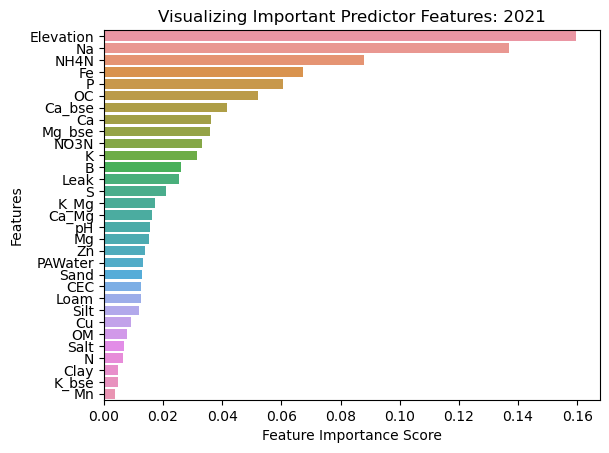

In [18]:
# Creating a bar plot
sns.barplot(x=features_importance, y=features_importance.index)
# Add labels to your graph
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')
plt.title("Visualizing Important Predictor Features: 2021")
os.makedirs('figures', exist_ok=True)  
plt.savefig('figures/importantfeatures_2021', bbox_inches='tight')
plt.show()

### Running the Random Forest Model Pipeline with the 2022 date:

In [19]:
soil_ga_gpd = geopandas.read_file("grandview_sections2.shp")
soil_ga_df = pd.DataFrame(soil_ga_gpd.drop(columns=['geometry', 'Latitude', 'Longitude', 'id', 'Texture']))

In [20]:
fruitcount_2022 = np.array(soil_ga_gpd['total_0908']) #variable to predict

soil_ga_df = soil_ga_df.drop('total_0816', axis = 1) 
soil_ga_df = soil_ga_df.drop('total_0908', axis = 1) 
soil_ga_df = soil_ga_df.fillna(0)

features = np.array(soil_ga_df) #predictor variables
feature_list = list(soil_ga_df.columns)

In [21]:
# Split the data into training and testing sets
train_features, test_features, train_labels, test_labels = train_test_split(features, fruitcount_2022) 

print('Training Features Shape:', train_features.shape)
print('Training Labels Shape:', train_labels.shape)
print('Testing Features Shape:', test_features.shape)
print('Testing Labels Shape:', test_labels.shape)


Training Features Shape: (3017, 31)
Training Labels Shape: (3017,)
Testing Features Shape: (1006, 31)
Testing Labels Shape: (1006,)


In [22]:
RandomForest = RandomForestRegressor(n_estimators = 215)
RandomForest.fit(train_features, train_labels); #Train the model on training data

In [23]:
predictions = RandomForest.predict(test_features) #predict with the test data
absolute_errors = abs(predictions - test_labels) #calculate absolute errors
print('Mean Absolute Error:', round(np.mean(absolute_errors), 2), 'degrees.') #reveal mean absolute error (mae)

Mean Absolute Error: 19.78 degrees.


In [24]:
mape = 100 * (absolute_errors / test_labels) #calculate mean absolute percentage error (MAPE)
accuracy = 100 - np.mean(mape) #calculate accuracy
print('Accuracy:', round(accuracy, 2), '%.')

Accuracy: 38.75 %.


In [25]:
features_importance = pd.Series(RandomForest.feature_importances_,index=feature_list).sort_values(ascending=False)
features_importancedf = pd.DataFrame(features_importance)
features_importancedf

,0
Elevation,0.275807
B,0.088313
P,0.066942
Fe,0.063990
Na,0.060349
NH4N,0.048330
Ca_bse,0.043244
OC,0.036543
Leak,0.031212
S,0.030211


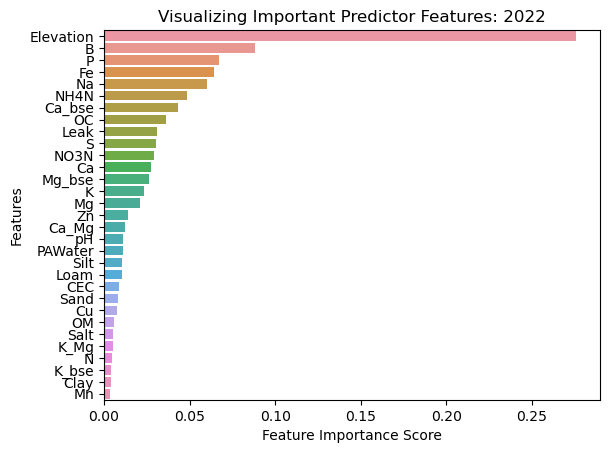

In [26]:
# Creating a bar plot
sns.barplot(x=features_importance, y=features_importance.index)
# Add labels to your graph
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')
plt.title("Visualizing Important Predictor Features: 2022")
os.makedirs('figures', exist_ok=True)  
plt.savefig('figures/importantfeatures_2022', bbox_inches='tight')
plt.show()

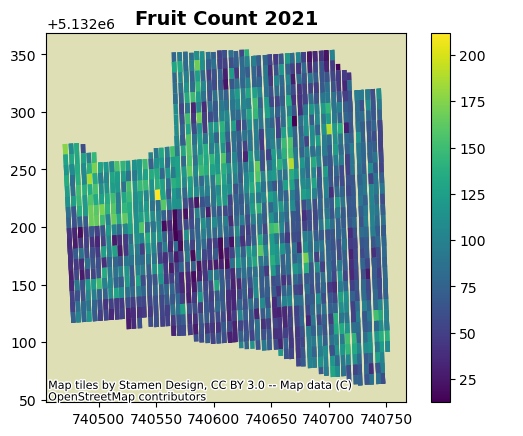

In [27]:
soil_ga_gpd = geopandas.read_file("grandview_sections2.shp")
ax = soil_ga_gpd.plot(column= 'total_0816', legend=True)
plt.title('Fruit Count 2021', fontsize = 14, fontweight='bold')
cx.add_basemap(ax, zoom=5, crs=soil_ga_gpd.crs)
os.makedirs('figures', exist_ok=True)  
plt.savefig('figures/2021_fruitcount', bbox_inches='tight')

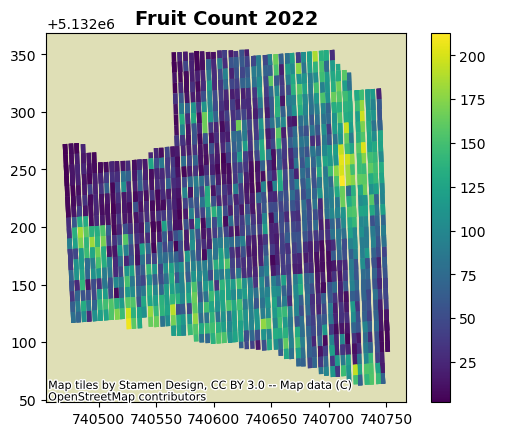

In [28]:
soil_ga_gpd = geopandas.read_file("grandview_sections2.shp")
ax = soil_ga_gpd.plot(column= 'total_0908', legend=True)
plt.title('Fruit Count 2022', fontsize = 14, fontweight='bold')
cx.add_basemap(ax, zoom=5, crs=soil_ga_gpd.crs)
os.makedirs('figures', exist_ok=True)  
plt.savefig('figures/2022_fruitcount', bbox_inches='tight')